In [1]:
!where python

c:\Users\derick\Documents\GitHub\696\env696\Scripts\python.exe
C:\Users\derick\AppData\Local\Programs\Python\Python312\python.exe
C:\Users\derick\AppData\Local\Microsoft\WindowsApps\python.exe


In [2]:
# run this code to make sure you install all the required libraries
# be sure you are in virtual environment before install, otherwise it will overwrite your local environment

# !pip install -r requirements.txt

In [3]:
import pandas as pd
import numpy as np

In [4]:
# fix random state
import os
RANDOM_SEED = 123
os.environ["OMP_NUM_THREADS"] = "1"
np.random.seed(42)
import torch
torch.manual_seed(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [5]:
# import necessary assets
import joblib

# the text column for both train/test sets are identical, so we simply choose one of them
train = joblib.load('assets/train_deep_learning.joblib')
test = joblib.load('assets/test_deep_learning.joblib')

In [6]:
train_non_BERT = train.copy()
train_BERT = train.copy()

# Text processing

In [7]:
# stop word
from gensim.parsing.preprocessing import STOPWORDS

stopwords = set(STOPWORDS)

stopwords.update([str(i) for i in range(10000)]) # add numeric characters to stop words

custom_stop_words = {'season', 'recap', 'episode', 'episodes', 'series', 'tv', 'blu', 'ray', 'dvd', 'included', 'wa', 'ni', 'na', 'wo', 'ga', 'ova',
                     'unaired', 'anime', 'released', 'characters', 'film', 'animation', 'animated', 'chan', 'kimi', 'boku', 'manga', 'volume', 'volumes',
                      'stories', 'comic', 'collection', 'video', 'story', 'official', 'ovas', 'ore', 'mo', 'artist', 'movie', 'bo', 'bobo', 'desu',
                      'anthology', 'kun', 'bd', 'release', 'recaps', 'aired', 'summary', 'bundled', 'ura', 'directed', 'published', 'chapters',
                      'serialized', 'based', 'magazine', 'edition', 'limited', 'announced', 'original', 'character', 'chapter', 'specials', 'special', 'short',
                      'second', 'shorts', 'featuring', 'new', 'version', 'main', 'features', 'created', 'adaptation', 'tales', 'set', 'events', 'novel'}

stopwords.update(custom_stop_words) # manually add stop words which are dominant but meaningless in the previous topic modeling result

## Text processing for LDA and NMF

Tokenization and lemmatization by keeping `{'NOUN', 'VERB', 'ADJ', 'PROPN', 'ADV'}` and remove named entity.

In [8]:
# tokenization and lemmatization
import spacy

POS_TO_KEEP = {'NOUN', 'VERB', 'ADJ', 'PROPN', 'ADV'}

nlp = spacy.load('en_core_web_sm')

def tokenization(doc):
    """
    Filter out number.
    Remove person, organization, and location entities.
    Return lemma if its POS is in `POS_TO_KEEP` and not in stop_words.
    """
    tokens = []

    for token in doc:
        if token.is_digit:
            # filter out numeric tokens
            continue

        if token.pos_ in POS_TO_KEEP and not token.lemma_ in stopwords and not token.ent_type_ in ['PERSON', 'ORG', 'GPE']:
            # return lemma if its POS is in `POS_TO_KEEP` and not in stop_words and not person, organization, and location
            tokens.append(token.lemma_)
    
    return tokens

# use nlp.pipe for batch processing
train_non_BERT['title_en_token'] = [
    tokenization(doc) for doc in nlp.pipe(train_non_BERT['title_english'], batch_size=100, n_process=-1)
]
train_non_BERT['synopsis_token'] = [
    tokenization(doc) for doc in nlp.pipe(train_non_BERT['synopsis'], batch_size=100, n_process=-1)
]

# filter out empty token
train_non_BERT = train_non_BERT[
    train_non_BERT['title_en_token'].apply(lambda x: len(x) > 0) | train_non_BERT['synopsis_token'].apply(lambda x: len(x) > 0)
] # at least title or synopsis should have tokens

print('Number of rows after filtering empty token: ', len(train_non_BERT))

Number of rows after filtering empty token:  19449


In [9]:
# review tokenization
with pd.option_context('display.max_colwidth', None):
    display(train_non_BERT[['title_english', 'title_en_token', 'synopsis', 'synopsis_token']].sample(1))

,title_english,title_en_token,synopsis,synopsis_token
6274,Delinquent Hamsters,"[Delinquent, Hamsters]",A short web anime about delinquent hamsters. Hamsters with bad boy haircuts that just do whatever they wanna do.,"[web, delinquent, hamster, hamster, bad, boy, haircut, wanna]"


Since titles and synopses play different roles (titles are short and often genre-indicative, while synopses provide detailed content descriptions), we use two separate vectorizers.

Titles are shorter and often contain rare, context-rich words that are crucial for capturing unique meaning, while synopses are longer and contain more common words, making them less reliant on capturing rare vocabulary. So, we use a higher `max_features` or `vector_size` for title to ensures it capture these niche terms and their relationships, while use lower for synopsis to focus on the more frequently relevant words.

### tfidf

In [10]:
from sklearn.feature_extraction.text import TfidfVectorizer

# initialize title tfidf
tfidf_title = TfidfVectorizer(
    ngram_range=(1,1),  # uni-gram
    min_df=1,           # don't filter rare words as they are important for title
    max_df=0.8,         # filter out very common words
)

# initialize synopsis tfidf
tfidf_synopsis = TfidfVectorizer(
    ngram_range=(1,2),  # uni-gram or bi-gram
    max_features=2000,  # focus on the more frequently relevant words
    min_df=2,           # filter out extremely rare words
    max_df=0.8,         # filter out very common words
)

# train tfidf
title_en_tfidf_matrix = tfidf_title.fit_transform(train_non_BERT['title_en_token'].apply(lambda x: " ".join(x)))
synopsis_tfidf_matrix = tfidf_synopsis.fit_transform(train_non_BERT['synopsis_token'].apply(lambda x: " ".join(x)))

# add result to train df
train_non_BERT['title_en_tfidf'] = [title_en_tfidf_matrix[i] for i in range(title_en_tfidf_matrix.shape[0])]
train_non_BERT['synopsis_tfidf'] = [synopsis_tfidf_matrix[i] for i in range(synopsis_tfidf_matrix.shape[0])]

### Word2Vec

For word embedding, we choose **Word2Vec - Skip-gram** because it tends to capture rare words more effectively (e.g. niche anime/manga-specific vocabulary), comparing to Word2Vec - CBOW and GloVe.

In [11]:
# word embedding
import multiprocessing
from gensim.models import Word2Vec

TITLE_DIM = 300
SYNOPSIS_DIM = 150

# dynamically determine the number of CPU cores
num_workers = multiprocessing.cpu_count()

# train title skipgram model
skipgram_model_title = Word2Vec(
    train_non_BERT['title_en_token'].tolist(),
    sg=1,               # skip-gram
    vector_size=TITLE_DIM,    # title use higher dim
    window=2,           # title use smaller window size
    min_count=1,        # titles may contain rare but important words
    epochs=30,          # title are shorter, need more epochs to train
    workers=num_workers,
    seed=RANDOM_SEED
)

# train synopsis skipgram model
skipgram_model_synopsis = Word2Vec(
    train_non_BERT['synopsis_token'].tolist(),
    sg=1,               # skip-gram
    vector_size=SYNOPSIS_DIM,    # synopsis use lower dim
    window=5,           # synopsis use larger window size
    min_count=2,        # filter out extremely rare words
    epochs=15,
    workers=num_workers,
    seed=RANDOM_SEED
)

# clean tokens that does not exist in the skipgram vocab (because of `min_count`)
model_vocab = set(skipgram_model_synopsis.wv.index_to_key)
train_non_BERT['synopsis_token_skipgram_clean'] = train_non_BERT['synopsis_token'].apply(lambda x: [token for token in x if token in model_vocab])

# apply skipgram model
train_non_BERT['title_en_skipgram'] = train_non_BERT['title_en_token'].apply(lambda x: skipgram_model_title.wv[x] if len(x) > 0 else np.zeros((1, TITLE_DIM)))
train_non_BERT['synopsis_skipgram'] = train_non_BERT['synopsis_token_skipgram_clean'].apply(lambda x: skipgram_model_synopsis.wv[x] if len(x) > 0 else np.zeros((1, SYNOPSIS_DIM)))

# filter out empty token
train_non_BERT = train_non_BERT[
    train_non_BERT['title_en_skipgram'].apply(lambda x: len(x) > 0) | train_non_BERT['synopsis_skipgram'].apply(lambda x: len(x) > 0)
] # at least title or synopsis should have tokens

In [12]:
train_non_BERT[['title_japanese', 'title_english', 'synopsis', 'title_en_tfidf', 'title_en_skipgram', 'synopsis_tfidf', 'synopsis_skipgram']].sample(5)

,title_japanese,title_english,synopsis,title_en_tfidf,title_en_skipgram,synopsis_tfidf,synopsis_skipgram
14169,グッバイ！異世界転生,Goodbye! I'm Being Reincarnated!,The dreams of every high school boy: To have b...,"(0, 6183)\t1.0","[[-0.08311489, 0.016843408, 0.14907968, -0.116...","(0, 1421)\t0.19956712159307624\n (0, 1971)\...","[[0.16540943, -0.14776173, -0.23013858, 0.3176..."
20782,姫君は騎士団長,The Knight Captain Is the New Princess-to-Be,"Christina, a.k.a. ""Lady Chris,"" was born into ...","(0, 1100)\t0.5694700215081138\n (0, 5874)\t...","[[-0.028130546, 0.1507615, 0.16478328, -0.0487...","(0, 1990)\t0.10292906447181278\n (0, 192)\t...","[[-0.14156838, 0.21011128, -0.12960754, -0.001..."
2559,それが声優！,Seiyu's Life!,Dreaming of becoming a top-tier professional i...,"(0, 4238)\t1.0","[[-0.29593274, -0.09408124, 0.18860681, -0.127...","(0, 1971)\t0.06279394314966527\n (0, 1930)\...","[[0.16540943, -0.14776173, -0.23013858, 0.3176..."
12427,ガリ勉地味萌え令嬢は、俺様王子などお呼びでない,The Lady Likes a Nerd over Princes,In a garden tucked away at the back of the mag...,"(0, 4112)\t0.39650750081361386\n (0, 4247)\...","[[-0.09168649, 0.07288021, 0.11777257, -0.1258...","(0, 663)\t0.15073916526313216\n (0, 1971)\t...","[[-0.3776792, 0.22272126, -0.3123273, 0.357470..."
1376,機動警察パトレイバー2 the Movie,Mobile Police Patlabor 2: The Movie,Three years after the Babylon Project conspira...,"(0, 4834)\t0.414051061134028\n (0, 4927)\t0...","[[-0.14565118, 0.7388114, 0.58311677, -0.01660...","(0, 998)\t0.10481787904321632\n (0, 1930)\t...","[[-0.25455478, 0.11306589, -0.049935047, 0.115..."


## Text Processing for BERTopic

As BERTopic can work directly on plain text, we will use the original title and synopsis as input, with minimal pre-processing, like stop word removal and NER, since anime/manga title and synopsis contain large number of named entities.

We will combine title and synopsis together for BERTopic, as this allows the model to capture a broader semantic representation of each document.

In [13]:
import spacy
import contractions

nlp = spacy.load('en_core_web_sm')

def remove_named_entities(doc):
    tokens = []
    
    for token in doc:
        # remove person, organization, and location entities
        if not token.ent_type_ in ['PERSON', 'ORG', 'GPE']:
            tokens.append(token.text)
    
    return ' '.join(tokens)

def preprocess_texts(texts):
    # expand contractions, such as "cant" -> "can not", preventing it tokenize to ["ca", "nt"]
    expanded_texts = [contractions.fix(text) for text in texts]
    
    # process texts in batches using nlp.pipe for efficiency
    processed_texts = [
        remove_named_entities(doc) for doc in nlp.pipe(expanded_texts, batch_size=100, n_process=-1)
    ]
    
    return processed_texts

# apply the preprocessing function
train_BERT['title_en_clean'] = preprocess_texts(train_BERT['title_english'])
train_BERT['synopsis_clean'] = preprocess_texts(train_BERT['synopsis'])
train_BERT['title_synopsis'] = train_BERT['title_en_clean'] + " " + train_BERT['synopsis_clean']

In [14]:
# embedding
from sentence_transformers import SentenceTransformer

embed_BERT = SentenceTransformer('paraphrase-MiniLM-L12-v2')
title_synopsis_embedded = embed_BERT.encode(train_BERT['title_synopsis'].tolist(), clean_up_tokenization_spaces=True)

c:\Users\derick\Documents\GitHub\696\env696\Lib\site-packages\sentence_transformers\cross_encoder\CrossEncoder.py:13: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange
c:\Users\derick\Documents\GitHub\696\env696\Lib\site-packages\transformers\tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


# Topic modeling

In [15]:
NUM_OF_TOPIC = 12

## LDA

In [16]:
# combine tfidf title and synopsis together as input of topic modeling
from scipy.sparse import hstack

combined_tfidf_matrix = hstack([title_en_tfidf_matrix, synopsis_tfidf_matrix])

# Combine the feature names from both vectorizers
feature_names_title = tfidf_title.get_feature_names_out().tolist()
feature_names_synopsis = tfidf_synopsis.get_feature_names_out().tolist()
combined_feature_names = feature_names_title + feature_names_synopsis

# mimic the behavior of a single vectorizer for pyLDAvis visualization
class CombinedVectorizer:
    def get_feature_names_out(self):
        return combined_feature_names

In [17]:
# LDA with tfidf title and synopsis
import pyLDAvis
import pyLDAvis.lda_model
from sklearn.decomposition import LatentDirichletAllocation

lda_model = LatentDirichletAllocation(n_components=NUM_OF_TOPIC, random_state=RANDOM_SEED)
lda_topic_distribution = lda_model.fit_transform(combined_tfidf_matrix)

temp_df = pd.DataFrame(lda_topic_distribution)

# the dominant topic for each document
train_non_BERT.loc[:, 'topic_LDA'] = temp_df.idxmax(axis=1)
# the confidence score for each document
train_non_BERT.loc[:, 'topic_LDA_score'] = temp_df.max(axis=1)
# normalize the confidence scores to range between 0 and 1
train_non_BERT.loc[:, 'topic_LDA_score'] = (train_non_BERT['topic_LDA_score'] - train_non_BERT['topic_LDA_score'].min()) / (train_non_BERT['topic_LDA_score'].max() - train_non_BERT['topic_LDA_score'].min())

# visualization
pyLDAvis.enable_notebook()
lda_vis = pyLDAvis.lda_model.prepare(lda_model, combined_tfidf_matrix, CombinedVectorizer(), mds='tsne')
lda_vis

PreparedData(topic_coordinates=               x          y  topics  cluster       Freq
topic                                                  
9      25.982548   4.783874       1        1  39.321390
10     -3.999660 -27.305202       2        1  23.900483
11    -17.857382   5.323825       3        1   7.687077
2     -15.113153 -12.760984       4        1   4.008274
6       9.167472   5.289656       5        1   3.852504
7      -3.862148  -0.262158       6        1   3.807093
0      -3.377455  16.561960       7        1   3.078667
5      14.734285  -7.745675       8        1   3.062355
3      14.175648 -24.566916       9        1   2.927069
4      14.743764  19.274784      10        1   2.902054
8       1.696544 -13.312095      11        1   2.826830
1      28.701286 -13.381763      12        1   2.626205, topic_info=             Term        Freq       Total Category  logprob  loglift
9782        music  206.000000  206.000000  Default  30.0000  30.0000
10271        song  183.000000  183.000000  Default  29.0000  29.0000
9783   music song  114.000000  114.000000  Default  28.0000  28.0000
4332         love  391.000000  391.000000  Default  27.0000  27.0000
9538      include  194.000000  194.000000  Default  26.0000  26.0000
...           ...         ...         ...      ...      ...      ...
7384         suit   10.766962   43.128802  Topic12  -5.5698   2.2519
3534        human    7.880663   17.314193  Topic12  -5.8819   2.8525
3201       gundam    9.894442   46.213720  Topic12  -5.6543   2.0983
9435       gundam    7.461014   18.280553  Topic12  -5.9366   2.7435
5116        night    7.697801   80.961198  Topic12  -5.9054   1.2866

[737 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
61        3  0.899285    academia
76        8  0.876106         ace
8671      2  0.261654  adventurer
8671      3  0.639599  adventurer
8671      5  0.029073  adventurer
...     ...       ...         ...
8603      3  0.782760        zero
8603      6  0.138134        zero
8619      8  0.929100      zombie
8621      9  0.794702        zone
8621     10  0.099338        zone

[2151 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[10, 11, 12, 3, 7, 8, 1, 6, 4, 5, 9, 2])

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_topic_score_distribution(df, topic_col, score_col, title):
    """
    Function to visualize the distribution of the confidence score for each topic.
    """

    plt.figure(figsize=(10, 8))

    sns.boxplot(x=topic_col, y=score_col, data=df)

    plt.title(f'Distribution of Topic Scores for {title}')
    plt.xlabel('Topic')
    plt.ylabel('Topic Score')
    
    plt.show()

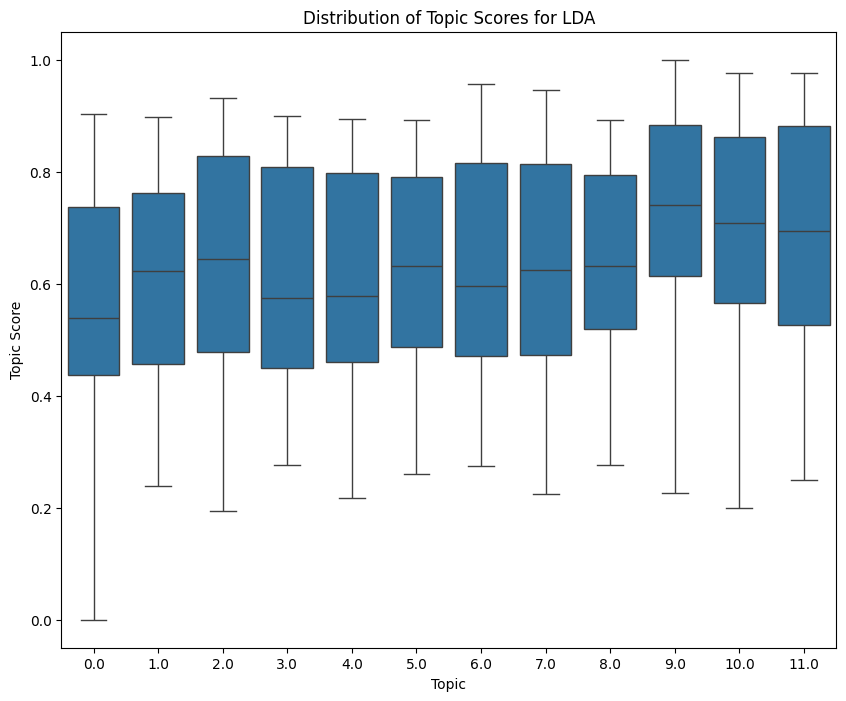

In [19]:
plot_topic_score_distribution(train_non_BERT, 'topic_LDA', 'topic_LDA_score', 'LDA')

In [20]:
# top 20 confidence for each topic
for topic in range(NUM_OF_TOPIC):
    print('topic: ', topic, '\n', train_non_BERT[train_non_BERT['topic_LDA']==topic].sort_values('topic_LDA_score', ascending=False)['title_japanese'].head(20).tolist())

topic:  0 
 ['大鱼海棠', 'JERV', '데드데이즈', '銀河旋風ブライガー', '孤独な富豪', '魔王 JUVENILE REMIX', 'バケモノとケダモノ', '어쩐지 좋은 일이 생길 것 같은 저녁', '背徳の庭', 'デトネイター・オーガン', '輪廻のラグランジェ', 'フラウ・ファウスト', 'こえだちゃん', 'あの子に優しい世界がいい', 'オルフィーナ', 'みんな今日も元気', '両想いの確率論', '天晴爛漫!', 'シャンパンは恋の媚薬', 'テニスの王子様']
topic:  1 
 ['ヴイナス戦記', 'ポケモンおもさくらべバトル', 'バベルの本', '越後の昔ばなし あったてんがのぉ', 'マルドゥック・スクランブル 燃焼', 'DEATH NOTE 特別読切', '斉木楠雄のΨ難 2', '都市喵奇谭', '블루밍 시퀀스', '闇夜', 'エスアザーワイズ', 'ようこそ実力至上主義の教室へ', '엔딩메이커', '怪物王女', '시녀로 살아남기', 'モンストアニメ 渇望の果ての理想郷', '追放の賢者、世界を知る ～幼馴染勇者の圧力から逃げて自由になった俺～', '夜ヲ東ニ', '映画 ドラえもん のび太の創世日記', '砂漠のハレム']
topic:  2 
 ['窮鼠はチーズの夢を見る', '青春のアフター', '鉄道少女漫画', '天才バカボン', 'ぱすてる', 'はぴはぴクローバー', '勇者になれなかった俺はしぶしぶ就職を決意しました。OVA', 'おもいっきり科学アドベンチャー そーなんだ!', '機動戦士ガンダム戦記 アバンタイトル', '禁断の母穴', 'ジュダールの王冠', 'すんどめ!! ミルキーウェイ', '獣王星', 'TiTiKEi', '暗殺教室', 'パパンがパンダ！', '少女まんが家の恋', 'ましろ色シンフォニー -The color of lovers-', 'ブルーピリオド', '終電後、カプセルホテルで、上司に微熱伝わる夜。']
topic:  3 
 ['映画 ドラえもん 新・のび太の大魔境～ペコと5人の探検隊～', '島影', '八雲立つ', 'シキザクラ', 'ホライズン', '敲敲', '君と美味しい愛のコトノハ', 'ジンジャーハニー', '

## NMF

In combining the title and synopsis embeddings for each anime/manga entry, we faced the challenge of differing word lengths. Directly stacking the embeddings could cause imbalance in representing the two sources of information. To address this, we chose to average the embeddings for each entry, allowing us to capture the overall semantic meaning of the entire document without losing the key contextual information. While it does lose some individual word-level granularity, the averaged vector still provides a strong representation of the dominant themes.

In [21]:
# combine skip-gram title and synopsis together as input of topic modeling

train_non_BERT['combined_embedding'] = train_non_BERT.apply(
    lambda row: np.hstack((
        np.mean(row['title_en_skipgram'], axis=0),
        np.mean(row['synopsis_skipgram'], axis=0)
    ))
    , axis=1
)
print("shape before combine: \n", train_non_BERT['title_en_skipgram'][0].shape, train_non_BERT['synopsis_skipgram'][0].shape)
print("shape after combine: \n", train_non_BERT['combined_embedding'][0].shape)

shape before combine: 
 (1, 300) (87, 150)
shape after combine: 
 (450,)


In [22]:
from sklearn.decomposition import NMF
from sklearn.preprocessing import MinMaxScaler

# convert the series into a 2D numpy array
embedding_matrix = np.vstack(train_non_BERT['combined_embedding'].values)

# apply Min-Max Normalization to due with negative value
min_max_scaler = MinMaxScaler()
embedding_matrix_non_negative = min_max_scaler.fit_transform(embedding_matrix)

nmf_model = NMF(n_components=NUM_OF_TOPIC, random_state=RANDOM_SEED, init="nndsvd", max_iter=20000)
nmf_topic_distribution = nmf_model.fit_transform(embedding_matrix_non_negative)

# find the dominant topic for each document
train_non_BERT['topic_nmf'] = np.argmax(nmf_topic_distribution, axis=1)
# the confidence score for each document
train_non_BERT['topic_nmf_score'] = np.max(nmf_topic_distribution, axis=1)
# normalize the confidence scores to range between 0 and 1
train_non_BERT['topic_nmf_score'] = (train_non_BERT['topic_nmf_score'] - train_non_BERT['topic_nmf_score'].min()) / (train_non_BERT['topic_nmf_score'].max() - train_non_BERT['topic_nmf_score'].min())

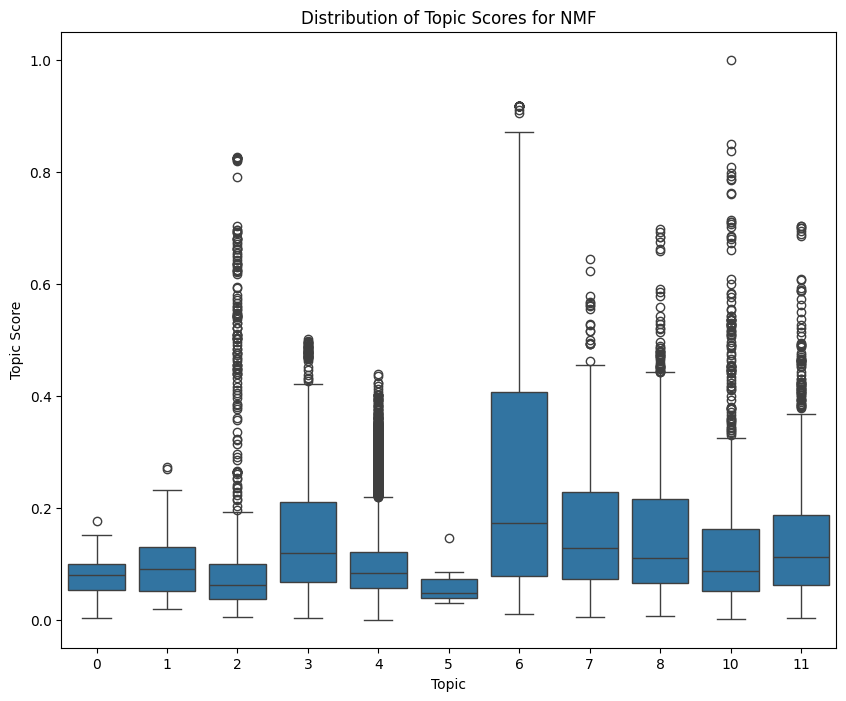

In [23]:
plot_topic_score_distribution(train_non_BERT, 'topic_nmf', 'topic_nmf_score', 'NMF')

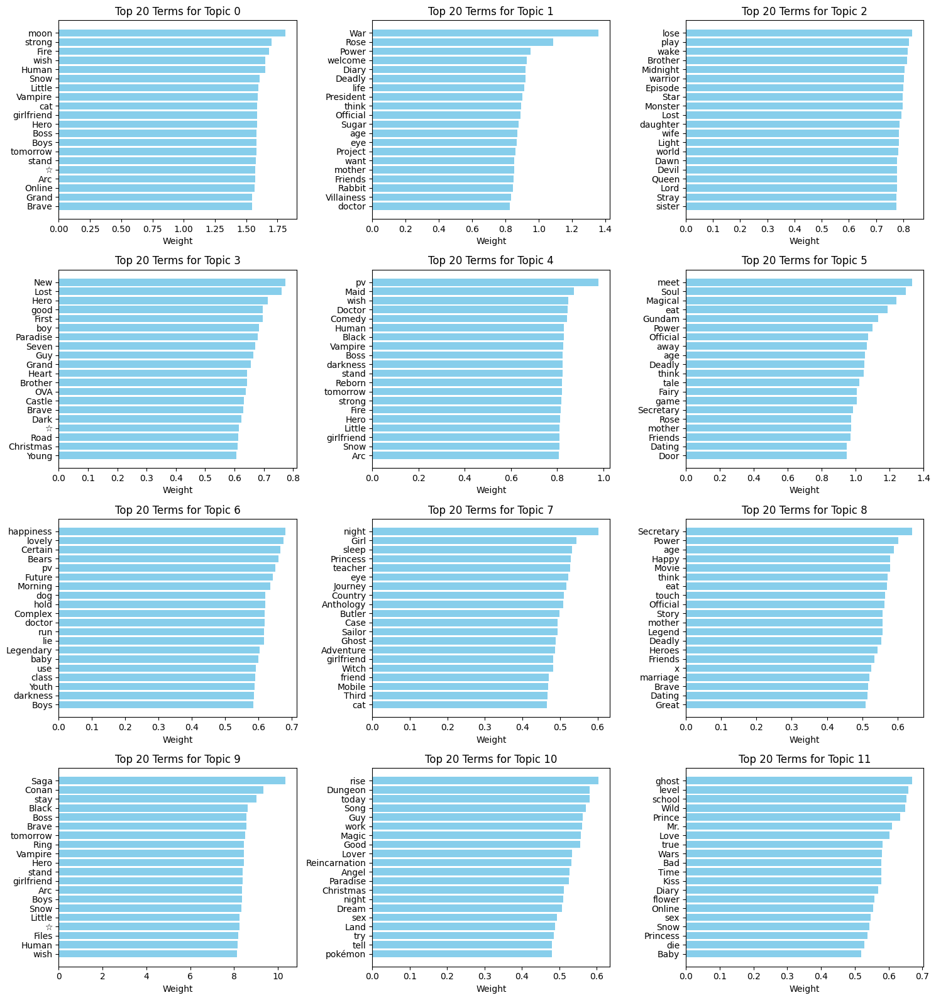

In [24]:
# review top terms for each topic
import matplotlib.pyplot as plt

combined_vocab = list(skipgram_model_title.wv.index_to_key) + list(skipgram_model_synopsis.wv.index_to_key)

def plot_top_terms_per_topic_NMF(model, feature_names, top_n=20, columns=3):
    topic_term_matrix = model.components_
    num_topics = topic_term_matrix.shape[0]
    rows = (num_topics + columns - 1) // columns  # calculate number of rows needed
    
    # set the overall size of the figure
    fig, axes = plt.subplots(rows, columns, figsize=(15, rows * 4))
    axes = axes.flatten()
    
    # loop through each topic and plot the top terms
    for topic_idx, topic in enumerate(topic_term_matrix):
        # get the top terms and their weights for the current topic
        top_term_indices = topic.argsort()[-top_n:][::-1]
        top_terms = [feature_names[i] for i in top_term_indices]
        top_term_weights = topic[top_term_indices]
        
        # plot the bar chart for this topic
        ax = axes[topic_idx] if num_topics > 1 else axes
        ax.barh(top_terms, top_term_weights, color="skyblue")
        ax.set_title(f"Top {top_n} Terms for Topic {topic_idx}")
        ax.invert_yaxis()  # invert to have the highest weight at the top
        ax.set_xlabel("Weight")
    
    plt.tight_layout()
    plt.show()

plot_top_terms_per_topic_NMF(nmf_model, combined_vocab)

In [25]:
# top 20 confidence for each topic
for topic in range(NUM_OF_TOPIC):
    print('topic: ', topic, '\n', train_non_BERT[train_non_BERT['topic_nmf']==topic].sort_values('topic_nmf_score', ascending=False)['title_japanese'].head(20).tolist())

topic:  0 
 ['越天の空', 'ブレンパワード', '辰奈１９０５', '\u200bスペースサーカス', 'ウルトラマン超闘士激伝 彗星戦神ツイフォン登場', 'ゲッターロボG', '逆天至尊', 'FRONTIER LINE', 'ゴブリンはもう十分に強い', 'サイレントメビウス', '戦場のヴァルキュリア -Gallian Chronicles-', '86―エイティシックス―', '遊撃宇宙戦艦ナデシコ', '메트로헌터', '直球表題 ロボットアニメ-STRAIGHT TITLE-', 'ストライクウィッチーズ', '太空历险记', '龍眼－ドラゴンアイ－', 'ドラゴンズヘブン', '淫獣学園 La☆Blue Girl 復活篇']
topic:  1 
 ['好きにしていーよ', '好きにしやがれ', '멸망 이후의 세계', '엔젤릭 레이디', '悪役令嬢と鬼畜騎士', '悪役令嬢は夜告鳥〈ナイチンゲール〉をめざす', '악녀에게 반하지 마세요', '死ぬほど好き', '愛に生きたいだけなのさ', '終わる世界でキミに恋する', 'あなたの世界で終わりたい', '恋ばっかりの世界でわたしはキミと', '終末の貞子さん', 'セカイの果て', 'セカイが滅びる前にキミに会いたい', '文句の付けようがないラブコメ', '文句の付けようがないラブコメ', '私が聖女？いいえ、悪役令嬢です！～なので、全員破滅〈メリバエンド〉は阻止させていただきます～', '양판소 주인공의 아내로 살아남기', '結婚の条件']
topic:  2 
 ['機動戦士ガンダム', '劇場版\u3000機動戦士ガンダム I\u3000特別編', '機動戦士ガンダム00', '機動戦士ガンダムSEED Ｘ Astray', '機動戦士ガンダム0083 STARDUST MEMORY', '機動戦士ガンダム00', '機動戦士ガンダム00', '機動戦士ガンダム 閃光のハサウェイ', '機動戦士ガンダム 00F', 'ジオニックフロント 機動戦士ガンダム0079 ジオンの悲憤', '機動戦士ガンダム École du Ciel -天空の学-', '機動戦士ガンダム・シード', '新機動戦記ガンダムW', '新機動戦記ガンダムＷ〈ウイング〉', '新機動戦記ガンダム

## BERTopic

We use two-step approach: qualitative evaluation and quantitative fine-tuning.

First, we qualitatively evaluate the topics to gain an initial understanding of the suitable configuration and parameters for our dataset. Based on this evaluation, the following configuration was found to be suitable:
- KMeans for clustering
- Number of Topics set between 10 to 12
- combination of unigrams and bigrams
- expand the list of stop words based on previous topic modeling results, removing dominant but meaningless words
- "paraphrase-MiniLM-L12-v2" model performs well for embedding

After establishing a suitable qualitative setup, we move to a quantitative approach using average topic probability to fine-tune hyperparameter.

In [26]:
from bertopic import BERTopic
from umap import UMAP
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import ParameterGrid
from scipy.spatial.distance import cdist

vectorizer = CountVectorizer(ngram_range=(1, 2), stop_words=list(stopwords))  # uni and bi-gram, with custom stopwords list

# Parameter grid for hyperparameters
param_grid = {
    'n_neighbors': [10, 15],
    'min_dist': [0.1, 0.2],
    'n_components': [2, 5, 10],
    'n_clusters': [10, 11, 12]
}

# Initialize variables to track the best model and its average topic probability
best_model = None
best_avg_topic_probability = -np.inf
best_params = {}

# Function to calculate average topic probability
def calculate_topic_probability(model, reduced_embeddings, topics):
    # Get the cluster centers from KMeans
    cluster_centers = model.hdbscan_model.cluster_centers_

    # Calculate the distance of each document to each cluster center
    distances = cdist(reduced_embeddings, cluster_centers, metric='euclidean')

    # Use a softmax-like transformation to convert distances into a pseudo-probability distribution
    probabilities = np.exp(-distances) / np.exp(-distances).sum(axis=1, keepdims=True)

    # The maximum probability for each document for its assigned topic
    topic_probabilities = [
        prob[topic] if topic != -1 else 0  # Set 0 for documents not assigned to any topic
        for prob, topic in zip(probabilities, topics)
    ]

    # Calculate the average probability across all documents
    return topic_probabilities

# Iterate over the parameter grid
for params in ParameterGrid(param_grid):
    # UMAP model with current parameters
    dim_red_model = UMAP(
        n_neighbors=params['n_neighbors'],
        n_components=params['n_components'],
        min_dist=params['min_dist'],
        metric='cosine',
        random_state=RANDOM_SEED
    )

    # Reduce the dimensionality of the embeddings using UMAP
    reduced_embeddings = dim_red_model.fit_transform(title_synopsis_embedded)
    
    # Create KMeans clustering model using the reduced dimensionality
    cluster_model = KMeans(n_clusters=params['n_clusters'], random_state=RANDOM_SEED)
    
    # Fit KMeans on the UMAP-reduced embeddings
    cluster_model.fit(reduced_embeddings)
    
    # Create BERTopic model with the current configuration
    BERT_model = BERTopic(
        language="english",
        umap_model=dim_red_model,
        hdbscan_model=cluster_model,
        vectorizer_model=vectorizer
    )
    
    # Fit the model
    topics, _ = BERT_model.fit_transform(train_BERT['title_synopsis'], embeddings=title_synopsis_embedded)
    
    # Compute average topic probability for the current model
    topic_probability = calculate_topic_probability(BERT_model, reduced_embeddings, topics)

    avg_topic_probability = np.mean(topic_probability)

    print(f"Testing parameters: {params}, Average Topic Probability: {avg_topic_probability}")
    
    # Update the best model if the current average topic probability is higher
    if avg_topic_probability > best_avg_topic_probability:
        best_avg_topic_probability = avg_topic_probability
        best_topic_probability = topic_probability
        best_model = BERT_model
        best_params = params
        best_topics = topics

print(f"Best parameters: {best_params}")
print(f"Best average topic probability: {best_avg_topic_probability}")

train_BERT['topic_BERTopic'] = best_topics
train_BERT['topic_BERTopic_score'] = best_topic_probability

# Visualize
best_model.visualize_topics()

Testing parameters: {'min_dist': 0.1, 'n_clusters': 10, 'n_components': 2, 'n_neighbors': 10}, Average Topic Probability: 0.15531812196397118
Testing parameters: {'min_dist': 0.1, 'n_clusters': 10, 'n_components': 2, 'n_neighbors': 15}, Average Topic Probability: 0.0431844671168859
Testing parameters: {'min_dist': 0.1, 'n_clusters': 10, 'n_components': 5, 'n_neighbors': 10}, Average Topic Probability: 0.06841299836709812
Testing parameters: {'min_dist': 0.1, 'n_clusters': 10, 'n_components': 5, 'n_neighbors': 15}, Average Topic Probability: 0.07030084385403568
Testing parameters: {'min_dist': 0.1, 'n_clusters': 10, 'n_components': 10, 'n_neighbors': 10}, Average Topic Probability: 0.054663998345889496
Testing parameters: {'min_dist': 0.1, 'n_clusters': 10, 'n_components': 10, 'n_neighbors': 15}, Average Topic Probability: 0.08598141664352539
Testing parameters: {'min_dist': 0.1, 'n_clusters': 11, 'n_components': 2, 'n_neighbors': 10}, Average Topic Probability: 0.09781678810659145
Test

In [27]:
"""# topic modeling - KMeans
from bertopic import BERTopic
from umap import UMAP
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import CountVectorizer
from scipy.spatial.distance import cdist

NUM_OF_TOPIC = 12

dim_red_model = UMAP(n_neighbors=15,
                    n_components=5,
                    min_dist=0.0,
                    metric='cosine',
                    random_state=RANDOM_SEED) # BERTopic's default UMAP model, but with fix random state

cluster_model = KMeans(n_clusters=NUM_OF_TOPIC, n_init=20, random_state=RANDOM_SEED)

vectorizer = CountVectorizer(ngram_range=(1, 2), stop_words=list(stopwords)) # uni and bi-gram, with custom stopwords list

BERT_model = BERTopic(language="english",
                      umap_model=dim_red_model,
                      hdbscan_model=cluster_model,
                      vectorizer_model=vectorizer)

# fit BERTopic model
train_BERT['topic_BERTopic'], _ = BERT_model.fit_transform(train_BERT['title_synopsis'], embeddings=title_synopsis_embedded)

# Access the embeddings after UMAP dimensionality reduction
reduced_embeddings = BERT_model.umap_model.transform(title_synopsis_embedded)

# Get the cluster centers from KMeans
cluster_centers = BERT_model.hdbscan_model.cluster_centers_

# Calculate the distance of each document to each cluster center
distances = cdist(reduced_embeddings, cluster_centers, metric='euclidean')

# use a softmax-like transformation to convert distances into a pseudo-probability distribution
probabilities = np.exp(-distances) / np.exp(-distances).sum(axis=1, keepdims=True)

# The maximum probability score for each document for its assigned topic
train_BERT['topic_BERTopic_score'] = [prob[topic] if topic != -1 else None for prob, topic in zip(probabilities, train_BERT['topic_BERTopic'])]

BERT_model.visualize_topics() # visualization"""

'# topic modeling - KMeans\nfrom bertopic import BERTopic\nfrom umap import UMAP\nfrom sklearn.cluster import KMeans\nfrom sklearn.feature_extraction.text import CountVectorizer\nfrom scipy.spatial.distance import cdist\n\nNUM_OF_TOPIC = 12\n\ndim_red_model = UMAP(n_neighbors=15,\n                    n_components=5,\n                    min_dist=0.0,\n                    metric=\'cosine\',\n                    random_state=RANDOM_SEED) # BERTopic\'s default UMAP model, but with fix random state\n\ncluster_model = KMeans(n_clusters=NUM_OF_TOPIC, n_init=20, random_state=RANDOM_SEED)\n\nvectorizer = CountVectorizer(ngram_range=(1, 2), stop_words=list(stopwords)) # uni and bi-gram, with custom stopwords list\n\nBERT_model = BERTopic(language="english",\n                      umap_model=dim_red_model,\n                      hdbscan_model=cluster_model,\n                      vectorizer_model=vectorizer)\n\n# fit BERTopic model\ntrain_BERT[\'topic_BERTopic\'], _ = BERT_model.fit_transform(tr

In [28]:
with pd.option_context('display.max_colwidth', None):
    display(best_model.get_topic_info()[['Topic', 'Count', 'Representation']])

,Topic,Count,Representation
0,0,2541,"[world, life, demon, magic, power, hero, years, king, day, time]"
1,1,2093,"[school, love, high, high school, student, day, girl, friends, friend, teacher]"
2,2,2000,"[girl, school, life, day, world, time, high, student, young, high school]"
3,3,1997,"[love, man, day, life, work, like, time, night, years, job]"
4,4,1942,"[world, life, mysterious, game, school, girl, young, day, named, time]"
5,5,1789,"[school, love, high, life, girl, high school, day, time, student, year]"
6,6,1740,"[earth, world, space, planet, war, known, battle, human, robot, called]"
7,7,1673,"[princess, prince, life, world, girl, family, love, vampire, time, day]"
8,8,1417,"[japanese, game, life, world, time, girl, bear, work, boy, little]"
9,9,1140,"[love, san, kiss, sensei, imouto, sama, ai, ka, sex, futari]"


In [29]:
best_model.visualize_documents(train_BERT['title_synopsis'].tolist(), embeddings=title_synopsis_embedded)

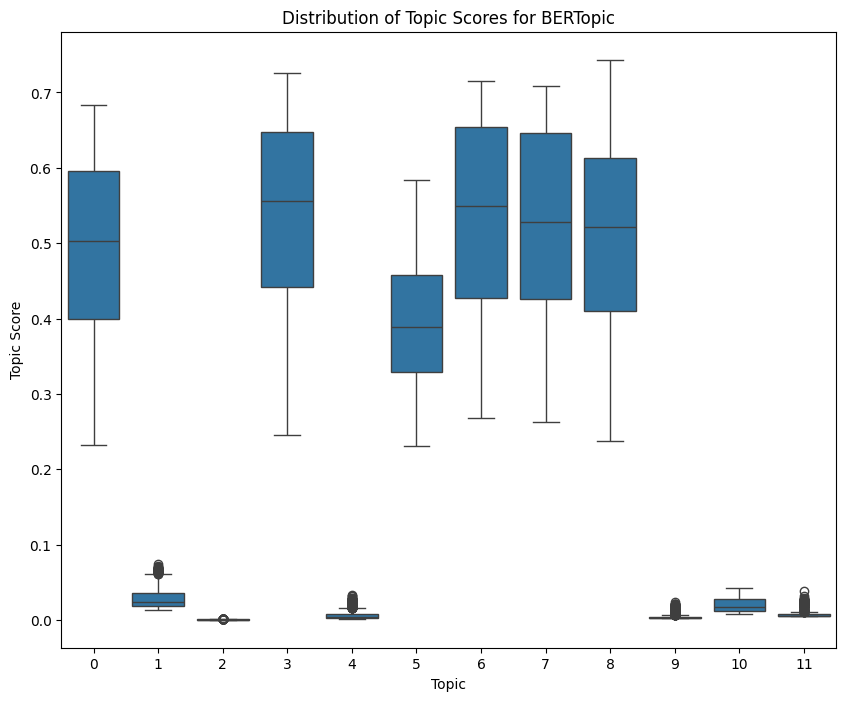

In [30]:
plot_topic_score_distribution(train_BERT, 'topic_BERTopic', 'topic_BERTopic_score', 'BERTopic')

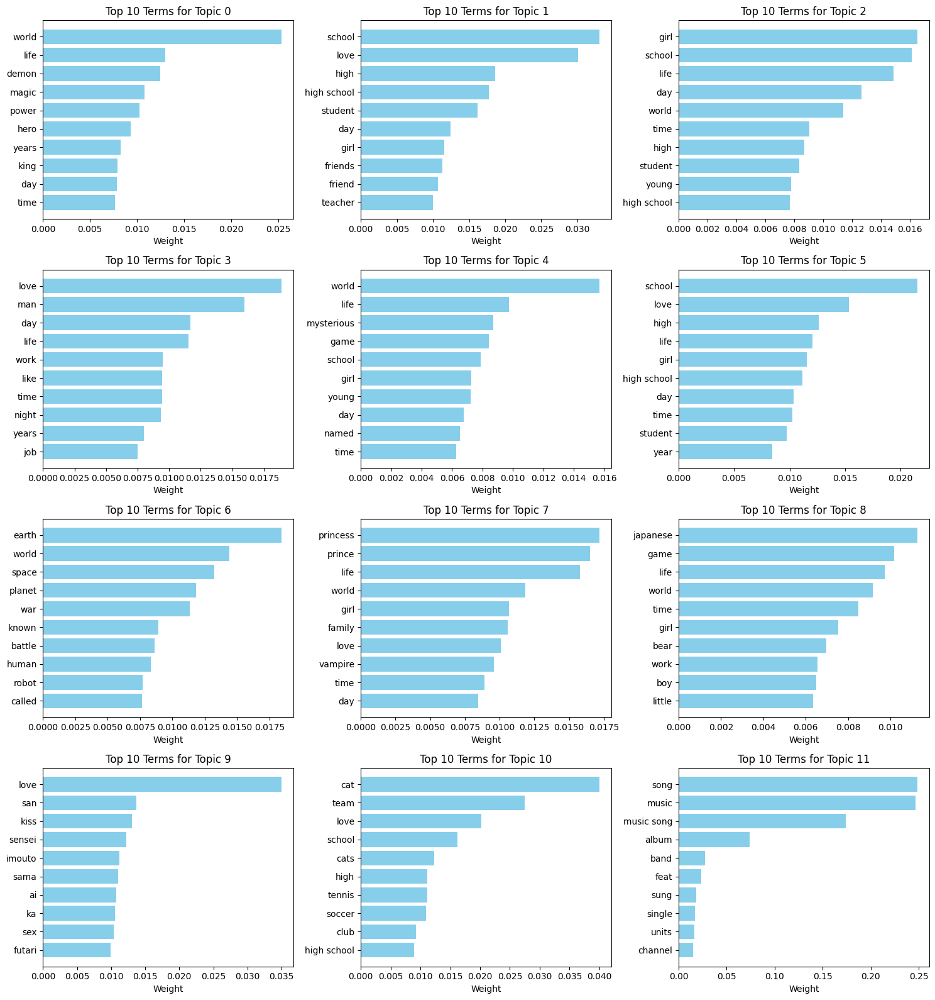

In [31]:
def plot_top_terms_per_topic_BERTopic(model, top_n=10, columns=3):
    topics = model.get_topics()
    num_topics = len(topics)

    # calculate number of rows needed
    rows = (num_topics + columns - 1) // columns

    # set the overall size of the figure
    fig, axes = plt.subplots(rows, columns, figsize=(15, rows * 4))
    axes = axes.flatten()

    # loop through each topic and plot the top terms
    for idx, (topic_num, terms) in enumerate(topics.items()):
        # get the top terms and their weights for the current topic
        terms_sorted = sorted(terms, key=lambda x: x[1], reverse=True)[:top_n]
        top_terms = [term[0] for term in terms_sorted]
        top_weights = [term[1] for term in terms_sorted]
        
        # plot the bar chart for this topic
        ax = axes[idx]
        ax.barh(top_terms, top_weights, color="skyblue")
        ax.set_title(f"Top {top_n} Terms for Topic {topic_num}")
        ax.invert_yaxis()  # invert to have the highest weight at the top
        ax.set_xlabel("Weight")

    plt.tight_layout()
    plt.show()

plot_top_terms_per_topic_BERTopic(best_model, top_n=10, columns=3)

In [32]:
# top 10 confidence for each topic
for topic in range(max(best_model.get_topic_info()['Topic'])+1):
    print('topic: ', topic)
    print(best_model.get_topic_info()['Representation'][topic])
    print(train_BERT[train_BERT['topic_BERTopic']==topic].sort_values('topic_BERTopic_score', ascending=False)['title_japanese'].head(10).tolist())

topic:  0
['world', 'life', 'demon', 'magic', 'power', 'hero', 'years', 'king', 'day', 'time']
['田中～年齢イコール彼女いない歴の魔法使い～', '大主宰', '闘神都市Ⅱ', '超越者となったおっさんはマイペースに異世界を散策する', '超神伝説うろつき童子 未来篇', '売王', '분신으로 자동사냥', '最強のおっさんハンター異世界へ～今度こそゆっくり静かに暮らしたい～', '交響詩篇エウレカセブン NEW ORDER', 'ハズレ枠の【状態異常スキル】で最強になった俺がすべてを蹂躙するまで']
topic:  1
['school', 'love', 'high', 'high school', 'student', 'day', 'girl', 'friends', 'friend', 'teacher']
['同棲ヤンキー 赤松セブン', '짱', '僕は君の鳥になりたい。', 'ストロベリー・パニック', '保健室のおたくおねえさんは好きですか？', 'サキュバスじゃないもん!', '陽あたり良好！', 'イマドキ', 'きんいろモザイク', '転じて恋と生き']
topic:  2
['girl', 'school', 'life', 'day', 'world', 'time', 'high', 'student', 'young', 'high school']
['イ・オ・ン', '8mm', '高野交差点', 'ハイスクールD×D アーシア＆小猫の ヒミツのけいやく!?', 'ピカチュウのなつやすみ', '1/100 SHIBUYA Crossing', 'ピアシェ～私のイタリアン～', 'ドラゴンヘッド', 'ヤマノススメ Next Summit', '橘子']
topic:  3
['love', 'man', 'day', 'life', 'work', 'like', 'time', 'night', 'years', 'job']
['わがままな人魚様', 'ワーキング’！！', 'WAVER（ウェーバー）', '僕の妻は感情がない', '家がなくなったので攻めホストに飼われることになりました。', 'シェフと泥棒', '하고 싶게 

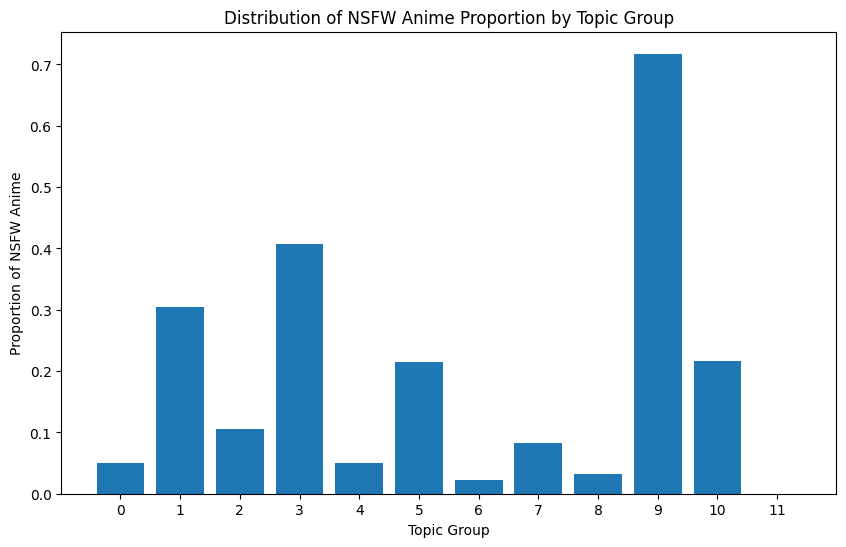

In [33]:
def nsfw_distribution(df, topic_col):
    # calculating proportion of NSFW for each topic group
    topic_nsfw_proportion = df.groupby(topic_col)['sfw'].apply(lambda x: 1 - x.mean()).reset_index()
    topic_nsfw_proportion.columns = [topic_col, 'nsfw_proportion']

    # plot the distribution
    plt.figure(figsize=(10, 6))
    plt.bar(topic_nsfw_proportion[topic_col], topic_nsfw_proportion['nsfw_proportion'])
    plt.xlabel('Topic Group')
    plt.ylabel('Proportion of NSFW Anime')
    plt.title('Distribution of NSFW Anime Proportion by Topic Group')
    plt.gca().set_xticks(range(len(topic_nsfw_proportion)))
    plt.show()

nsfw_distribution(train_BERT, 'topic_BERTopic')

In [34]:
with pd.option_context('display.max_colwidth', None):
    display(train_BERT[train_BERT['title_japanese'].str.contains('推しの子')][['title_english', 'synopsis', 'topic_BERTopic', 'is_anime']])

,title_english,synopsis,topic_BERTopic,is_anime
67,[Oshi No Ko],"In the entertainment world, celebrities often show exaggerated versions of themselves to the public, concealing their true thoughts and struggles beneath elaborate lies. Fans buy into these fabrications, showering their idols with undying love and support, until something breaks the illusion. Sixteen-year-old rising star Ai Hoshino of pop idol group B Komachi has the world captivated; however, when she announces a hiatus due to health concerns, the news causes many to become worried.\r\n\r\nAs a huge fan of Ai, gynecologist Gorou Amemiya cheers her on from his countryside medical practice, wishing he could meet her in person one day. His wish comes true when Ai shows up at his hospital—not sick, but pregnant with twins! While the doctor promises Ai to safely deliver her children, he wonders if this encounter with the idol will forever change the nature of his relationship with her.\r\n\r\n",1,1
8891,[Oshi No Ko],"Sixteen-year-old Ai Hoshino is a talented and beautiful idol who is adored by her fans. She is the personification of a pure, young maiden. But all that glitters is not gold.\r\n\r\nGorou Amemiya is a countryside gynecologist and a big fan of Ai. So when the pregnant idol shows up at his hospital, he is beyond bewildered. Gorou promises her a safe delivery. Little does he know, an encounter with a mysterious figure would result in his untimely death—or so he thought.\r\n\r\nOpening his eyes in the lap of his beloved idol, Gorou finds that he has been reborn as Aquamarine Hoshino—Ai's newborn son! With his world turned upside down, Gorou soon learns that the world of showbiz is paved with thorns, where talent does not always beget success. Will he manage to protect Ai's smile that he loves so much with the help of an eccentric and unexpected ally?\r\n\r\n",2,0


We grouped topics 1, 2, and 5 into the same group, 'High School Life and Romance,' because they share similar representative terms related to themes of love, school life. Upon further inspection, some titles appear to be overlapping or misclustered between these topics, suggesting they represent similar content. For example, the manga and anime versions of "Oshi No Ko" were clustered into topics 1 and 2 respectively, even though they are the same story.

In [35]:
# assign human-interpretable themes
topic_mapping = {
    0: 'Fantasy Adventure / Isekai (alternate world)',
    1: 'High School Life and Romance',
    2: 'High School Life and Romance',
    3: 'Adult Life, Work, and Relationships',
    4: 'Action and Superpowers',
    5: 'High School Life and Romance',
    6: 'Sci-Fi, Space, and Mecha Battles',
    7: 'Royalty, Nobles, and Family Drama',
    8: 'Light-Hearted, Mixed-Genre Shorts and Specials',
    9: 'Romance with sensitive content',
    10: 'Sports and Club Activities',
    11: 'Music, Bands, and Performances'
}

train_BERT['theme_assigned'] = train_BERT['topic_BERTopic'].apply(lambda x: topic_mapping[x])

# Prepare data for train/test set

## train/test set for deep learning

Apply same transformation on test set:

In [36]:
# apply the preprocessing function
test['title_en_clean'] = preprocess_texts(test['title_english'])
test['synopsis_clean'] = preprocess_texts(test['synopsis'])
test['title_synopsis'] = test['title_en_clean'] + " " + test['synopsis_clean']

# embedding
test_title_synopsis_embedded = embed_BERT.encode(test['title_synopsis'].tolist(), clean_up_tokenization_spaces=True)

# topic modeling
test_reduced_embeddings = best_model.umap_model.transform(test_title_synopsis_embedded) # UMAP
test_topics = best_model.hdbscan_model.predict(test_reduced_embeddings) # KMeans

# find topic score
test_topic_probabilities = calculate_topic_probability(
    model=best_model,
    reduced_embeddings=test_reduced_embeddings,
    topics=test_topics
)
test['topic_BERTopic_score'] = test_topic_probabilities

# assign human-interpretable themes
test['theme_assigned'] = [topic_mapping.get(topic, 'unknown') for topic in test_topics]

Output:

In [37]:
train_BERT.drop(columns=['topic_BERTopic', 'title_en_clean', 'synopsis_clean', 'title_synopsis'], inplace=True) # remove unnecessary columns

joblib.dump(train_BERT, 'assets/train_deep_learning_with_theme.joblib')
joblib.dump(test, 'assets/test_deep_learning_with_theme.joblib')

['assets/test_deep_learning_with_theme.joblib']

## train/test set for traditional machine learning

In [38]:
train_trad = joblib.load('assets/train_traditional_ml.joblib')
test_trad = joblib.load('assets/test_traditional_ml.joblib')

The entities in 2 train sets are identical, so we will simply add the theme directly to it.

In [39]:
train_trad[['theme_assigned', 'topic_BERTopic_score']] = train_BERT[['theme_assigned', 'topic_BERTopic_score']]
test_trad[['theme_assigned', 'topic_BERTopic_score']] = test[['theme_assigned', 'topic_BERTopic_score']]

one hot encoding:

In [40]:
# one-hot encoding for train set
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder(sparse_output=False)
encoded_data = enc.fit_transform(train_trad[['theme_assigned']])
encoded_columns = enc.get_feature_names_out(['theme_assigned'])
encoded_df = pd.DataFrame(encoded_data, columns=encoded_columns)

# combine the original DataFrame and the new one-hot encoded columns
train_trad_result = pd.concat([train_trad.reset_index(drop=True), encoded_df], axis=1)

In [41]:
# one-hot encoding for test set
encoded_data_test = enc.transform(test_trad[['theme_assigned']])
encoded_df_test = pd.DataFrame(encoded_data_test, columns=encoded_columns)

# combine the original DataFrame and the new one-hot encoded columns
test_trad_result = pd.concat([test_trad.reset_index(drop=True), encoded_df_test], axis=1)

output:

In [42]:
train_trad_result.drop(columns='theme_assigned', inplace=True) # remove unnecessary columns
test_trad_result.drop(columns='theme_assigned', inplace=True) # remove unnecessary columns

joblib.dump(train_trad_result, 'assets/train_traditional_ml_with_theme.joblib')
joblib.dump(test_trad_result, 'assets/test_traditional_ml_with_theme.joblib')

['assets/test_traditional_ml_with_theme.joblib']

In [43]:
# store library version
# run every time before you commit
!pip freeze > requirements.txt